# Jupyter Notebook für Aspekte der Datenanalyse
am Beispiel von Fraud Detection in Financial Transactions


#### Ausführung der notwendigen Imports

In [2]:
import pandas as pd
import plotly.express as px

from src.config import CLEAN_TRANSACTIONS_PATH

In [3]:
pd.set_option("display.float_format", "{:,.2f}".format)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)
pd.set_option("display.max_colwidth", None)

#### Einlesen des Datensatzes

In [4]:
df = pd.read_csv(CLEAN_TRANSACTIONS_PATH)

## Deskriptive Analyse

Die deskriptive Analyse dient dazu, historische Daten zu beschreiben,
zusammenzufassen und zu visualisieren, um zu erkennen, was in der Vergangenheit
passiert ist.

Dabei werden insbesondere Verteilungen, Häufigkeiten, Trends und Muster
untersucht. Ziel ist es, ein grundlegendes Verständnis des Datensatzes
zu schaffen und erste Auffälligkeiten sichtbar zu machen.

---

## Business-Fragestellungen der deskriptiven Analyse

1. Wie hoch ist der Anteil von Fraud- und Non-Fraud-Transaktionen?

2. Wie verteilen sich die Transaktionsbeträge im Datensatz?

3. Zu welchen Tageszeiten finden die meisten Transaktionen statt?

4. Zu welchen Uhrzeiten treten die meisten Betrugsfälle auf?

5. Welche Zahlungsmethoden werden am häufigsten verwendet?

6. Welche Gerätetypen werden am häufigsten für Transaktionen genutzt?

7. Welche Standorte weisen die meisten Transaktionen auf?

8. Welche Händlerkategorien dominieren den Datensatz?

9. Wie häufig treten fehlgeschlagene Transaktionen innerhalb der letzten 7 Tage auf?

10. Wie unterscheiden sich Fraud- und Non-Fraud-Transaktionen hinsichtlich ihrer zentralen Merkmale?

---

## Ziel der deskriptiven Analyse

Das Ziel der deskriptiven Analyse besteht darin, den Datensatz zunächst
grundlegend zu verstehen, zentrale Muster sichtbar zu machen und eine
fundierte Basis für die nachfolgenden diagnostischen, prädiktiven und
präskriptiven Analysen zu schaffen.

#### 1.1 Datenverständnis

##### Größe des Datensatzes

Zunächst wird untersucht, wie groß der Datensatz ist.
Dabei werden die Anzahl der Zeilen sowie die Anzahl der Spalten bestimmt.

In [5]:
print(f"Anzahl Zeilen: {df.shape[0]}")
print(f"Anzahl Spalten: {df.shape[1]}")

Anzahl Zeilen: 49998
Anzahl Spalten: 22


##### Erste Vorschau auf die Daten

Durch eine erste Vorschau können Struktur, Inhalte und erste Auffälligkeiten
im Datensatz betrachtet werden.

In [6]:
display(df.head(10))

,Transaction_ID,User_ID,Transaction_Amount,Transaction_Type,Account_Balance,Amount_to_Balance_Ratio,Device_Type,Location,Merchant_Category,IP_Address_Flag,Previous_Fraudulent_Activity,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Hour,Is_Weekend,Fraud_Label
0,txn_0,user_8270,95.97,atm withdrawal,"93,915.02",0.00,mobile,new york,restaurants,0,0,14,36.25,0,visa,27,"4,610.43",pin,0.38,6,0,0
1,txn_1,user_1860,55.41,atm withdrawal,"91,495.28",0.00,laptop,tokyo,clothing,0,0,7,435.42,1,visa,93,"2,284.15",pin,0.59,10,0,0
2,txn_10,user_2685,283.26,pos,"48,484.20",0.01,tablet,mumbai,electronics,0,1,1,363.07,0,mastercard,78,"4,273.45",password,0.62,5,1,0
3,txn_100,user_6056,57.24,atm withdrawal,"89,219.38",0.00,mobile,tokyo,groceries,0,0,14,89.36,0,visa,116,"3,446.99",biometric,0.08,10,0,0
4,txn_1000,user_9038,58.43,atm withdrawal,"40,090.04",0.00,laptop,london,travel,0,0,3,21.28,0,amex,200,"2,968.75",password,0.16,22,0,0
5,txn_10000,user_4648,16.37,bank transfer,"30,837.25",0.00,tablet,new york,groceries,0,0,6,363.33,3,amex,5,"1,198.43",biometric,0.81,18,0,0
6,txn_10001,user_6445,27.52,online,"18,273.83",0.00,mobile,new york,clothing,0,0,2,354.74,4,mastercard,28,"1,335.29",otp,0.78,8,1,1
7,txn_10002,user_3628,19.87,atm withdrawal,"4,380.72",0.00,tablet,tokyo,restaurants,0,0,1,366.28,2,discover,76,"1,607.64",pin,0.95,9,0,1
8,txn_10003,user_2656,99.68,pos,"87,541.23",0.00,tablet,london,groceries,0,0,4,65.83,0,discover,106,448.65,otp,0.08,0,1,0
9,txn_10004,user_1620,50.89,bank transfer,"50,643.87",0.00,tablet,sydney,groceries,0,0,2,146.49,4,mastercard,55,"3,156.90",password,0.10,6,0,1


##### Überblick über Datentypen und Variablen

In diesem Schritt werden die enthaltenen Variablen sowie deren Datentypen analysiert.
Dabei wird zwischen numerischen und kategorischen Variablen unterschieden.

In [7]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 49998 entries, 0 to 49997
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Transaction_ID                49998 non-null  str    
 1   User_ID                       49998 non-null  str    
 2   Transaction_Amount            49998 non-null  float64
 3   Transaction_Type              49998 non-null  str    
 4   Account_Balance               49998 non-null  float64
 5   Amount_to_Balance_Ratio       49998 non-null  float64
 6   Device_Type                   49998 non-null  str    
 7   Location                      49998 non-null  str    
 8   Merchant_Category             49998 non-null  str    
 9   IP_Address_Flag               49998 non-null  int64  
 10  Previous_Fraudulent_Activity  49998 non-null  int64  
 11  Daily_Transaction_Count       49998 non-null  int64  
 12  Avg_Transaction_Amount_7d     49998 non-null  float64
 13  Failed_Trans

##### Numerische und kategorische Variablen identifizieren

In [8]:
numerical_columns = df.select_dtypes(include=["int64", "float64"]).columns
categorical_columns = df.select_dtypes(include=["object"]).columns

print("Numerische Variablen:")
print(numerical_columns)

print("\nKategorische Variablen:")
print(categorical_columns)

Numerische Variablen:
Index(['Transaction_Amount', 'Account_Balance', 'Amount_to_Balance_Ratio',
       'IP_Address_Flag', 'Previous_Fraudulent_Activity',
       'Daily_Transaction_Count', 'Avg_Transaction_Amount_7d',
       'Failed_Transaction_Count_7d', 'Card_Age', 'Transaction_Distance',
       'Risk_Score', 'Hour', 'Is_Weekend', 'Fraud_Label'],
      dtype='str')

Kategorische Variablen:
Index(['Transaction_ID', 'User_ID', 'Transaction_Type', 'Device_Type',
       'Location', 'Merchant_Category', 'Card_Type', 'Authentication_Method'],
      dtype='str')


/var/folders/b8/sbt1y9vx2kl1whbqys3jf1wm0000gn/T/ipykernel_2012/832660727.py:2: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  categorical_columns = df.select_dtypes(include=["object"]).columns


##### Wichtige Variablen im Datensatz

| Spalte | Beschreibung |
|---|---|
| Transaction_ID | Eindeutige ID der Transaktion |
| User_ID | Eindeutige ID des Nutzers |
| Timestamp | Zeitpunkt der Transaktion |
| Transaction_Amount | Höhe der Transaktion |
| Card_Type | Typ der verwendeten Karte |
| Merchant_Category | Händlerkategorie |
| Device_Type | Verwendeter Gerätetyp |
| Location | Standort der Transaktion |
| Authentication_Method | Verwendete Authentifizierungsmethode |
| Account_Balance | Kontostand des Nutzers |
| Amount_to_Balance_Ratio | Verhältnis von Betrag zu Kontostand |
| IP_Address_Flag | Auffälligkeit der IP-Adresse |
| Previous_Fraudulent_Activity | Frühere Fraud-Aktivitäten |
| Daily_Transaction_Count | Anzahl täglicher Transaktionen |
| Avg_Transaction_Amount_7d | Durchschnittlicher Betrag der letzten 7 Tage |
| Failed_Transaction_Count_7d | Fehlgeschlagene Transaktionen der letzten 7 Tage |
| Card_Age | Alter der Karte |
| Transaction_Distance | Distanz der Transaktion |
| Risk_Score | Berechneter Risikowert |
| Hour | Uhrzeit der Transaktion |
| Is_Weekend | Kennzeichnung Wochenende |
| Fraud_Label | Fraud- oder Non-Fraud-Kennzeichnung |

#### 1.2 Deskriptive Kennzahlen

##### Allgemeine statistische Kennzahlen

Zur Beschreibung numerischer Variablen werden zentrale statistische Kennzahlen berechnet.
Dazu zählen Mittelwert, Median, Standardabweichung sowie Minimal- und Maximalwerte.

In [9]:
desc_stats = (
    df.describe()
    .T[
        ["mean", "std", "min", "25%", "50%", "75%", "max"]
    ]
    .rename(columns={
        "mean": "Mean",
        "std": "Std",
        "min": "Min",
        "25%": "Q1",
        "50%": "Median",
        "75%": "Q3",
        "max": "Max"
    })
    .round(2)
)

desc_stats

,Mean,Std,Min,Q1,Median,Q3,Max
Transaction_Amount,99.41,98.69,0.01,28.68,69.67,138.86,"1,174.14"
Account_Balance,"50,292.62","28,760.10",500.48,"25,355.42","50,381.45","75,112.36","99,998.31"
Amount_to_Balance_Ratio,0.01,0.02,0.00,0.00,0.00,0.00,1.05
IP_Address_Flag,0.05,0.22,0.00,0.00,0.00,0.00,1.00
Previous_Fraudulent_Activity,0.10,0.30,0.00,0.00,0.00,0.00,1.00
Daily_Transaction_Count,7.48,4.04,1.00,4.00,7.00,11.00,14.00
Avg_Transaction_Amount_7d,255.27,141.38,10.00,132.08,256.08,378.03,500.00
Failed_Transaction_Count_7d,2.00,1.41,0.00,1.00,2.00,3.00,4.00
Card_Age,120.00,68.98,1.00,60.00,120.00,180.00,239.00
Transaction_Distance,"2,499.12","1,442.02",0.25,"1,256.45","2,490.62","3,746.31","4,999.93"


##### Fraud-Rate des Datensatzes

Die Fraud-Rate beschreibt den Anteil betrügerischer Transaktionen
an allen vorhandenen Transaktionen.

In [10]:
fraud_rate = df["Fraud_Label"].mean()

print(f"Fraud Rate: {fraud_rate:.2%}")

Fraud Rate: 32.13%


##### Anzahl von Fraud- und Non-Fraud-Transaktionen

In [11]:
df["Fraud_Label"].value_counts()

Fraud_Label
0    33933
1    16065
Name: count, dtype: int64

##### Durchschnittlicher Transaktionsbetrag nach Fraud-Status

In [12]:
df.groupby("Fraud_Label")[
    "Transaction_Amount"
].mean()

Fraud_Label
0   99.28
1   99.70
Name: Transaction_Amount, dtype: float64

#### 1.3 Verteilungen und Visualisierungen

##### Verteilung der Fraud- und Non-Fraud-Transaktionen

Die Verteilung der Zielvariable zeigt,
wie stark Fraud- und Non-Fraud-Fälle im Datensatz vertreten sind.

In [13]:
fig = px.histogram(
    df,
    x="Fraud_Label",
    title="Distribution of Fraud and Non-Fraud Transactions"
)

fig.show()

##### Verteilung der Transaktionsbeträge

Die Verteilung der Transaktionsbeträge wird untersucht,
um typische Wertebereiche und mögliche Ausreißer sichtbar zu machen.

In [14]:
fig = px.histogram(
    df,
    x="Transaction_Amount",
    nbins=80,
    marginal="box",
    title="Distribution of Transaction Amounts"
)

fig.update_layout(
    xaxis_title="Transaction Amount",
    yaxis_title="Frequency"
)

fig.show()

##### Verteilung der Gerätetypen

Die Analyse der Gerätetypen zeigt,
welche Arten von Geräten für Transaktionen genutzt werden.

In [15]:
device_dist = (
    df["Device_Type"]
    .value_counts()
    .reset_index()
)

device_dist.columns = ["Device_Type", "Count"]

device_dist

,Device_Type,Count
0,tablet,16778
1,mobile,16639
2,laptop,16581


In [16]:
fig = px.bar(
    device_dist,
    x="Device_Type",
    y="Count",
    title="Distribution of Device Types"
)

fig.show()

##### Verteilung der Kartentypen
Die Analyse der Kartentypen zeigt, welche Arten von Kreditkarten für Transaktionen genutzt werden.

In [17]:
card_type_dist = (
    df["Card_Type"]
    .value_counts()
    .reset_index()
)

card_type_dist.columns = ["Card_Type", "Count"]

card_type_dist

,Card_Type,Count
0,mastercard,12693
1,visa,12560
2,amex,12419
3,discover,12326


In [18]:
fig = px.bar(
    card_type_dist,
    x="Card_Type",
    y="Count",
    title="Distribution of Card Types",
    text="Count"
)

fig.update_traces(
    textposition="outside"
)

fig.update_layout(
    xaxis_title="Card Type",
    yaxis_title="Number of Transactions"
)

fig.show()

##### Verteilung der Standorte
Die Analyse der Standorte zeigt, von welchen Standorten aus die meisten Transaktionen getätigt werden.

In [19]:
location_dist = (
    df["Location"]
    .value_counts()
    .reset_index()
)

location_dist.columns = ["Location", "Transactions"]

location_dist.head(10)

,Location,Transactions
0,tokyo,10207
1,mumbai,9994
2,london,9944
3,sydney,9938
4,new york,9915


In [20]:
fig = px.bar(
    location_dist.head(10).sort_values("Transactions"),
    x="Transactions",
    y="Location",
    orientation="h",
    title="Top 10 Locations by Number of Transactions",
    text="Transactions"
)

fig.show()

##### Verteilung der Händlerkategorien

Die Händlerkategorien werden untersucht,
um dominante Kategorien im Datensatz zu identifizieren.

In [21]:
merchant_dist = (
    df["Merchant_Category"]
    .value_counts()
    .head(10)
    .reset_index()
)

merchant_dist.columns = ["Merchant_Category", "Count"]

merchant_dist

,Merchant_Category,Count
0,clothing,10033
1,groceries,10019
2,travel,10015
3,restaurants,9975
4,electronics,9956


In [22]:
fig = px.bar(
    merchant_dist,
    x="Merchant_Category",
    y="Count",
    title="Top Merchant Categories"
)

fig.show()

##### Zeitliche Verteilung der Transaktionen

Die zeitliche Verteilung zeigt,
zu welchen Tageszeiten die meisten Transaktionen stattfinden.

In [23]:
hourly = (
    df["Hour"]
    .value_counts()
    .sort_index()
    .reset_index()
)

hourly.columns = ["Hour", "Transactions"]

hourly

,Hour,Transactions
0,0,2089
1,1,1996
2,2,2155
3,3,2095
4,4,2045
5,5,2058
6,6,2053
7,7,2024
8,8,2101
9,9,2000


In [24]:
fig = px.line(
    hourly,
    x="Hour",
    y="Transactions",
    markers=True,
    title="Transactions by Hour"
)

fig.show()

Ergänzend hier noch die zeitliche Verteilung aller Betrugsfälle

In [25]:
fraud_by_hour = (
    df[df["Fraud_Label"] == 1]["Hour"]
    .value_counts()
    .sort_index()
    .reset_index()
)

fraud_by_hour.columns = ["Hour", "Fraud_Transactions"]

fig = px.line(
    fraud_by_hour,
    x="Hour",
    y="Fraud_Transactions",
    markers=True,
    title="Fraud Transactions by Hour"
)

fig.show()

##### Fehlgeschlagene Transaktionen innerhalb von sieben Tagen

Die Verteilung fehlgeschlagener Transaktionen
innerhalb der letzten sieben Tage wird visualisiert.

In [26]:
fig = px.histogram(
    df,
    x="Failed_Transaction_Count_7d",
    nbins=30,
    title="Distribution of Failed Transactions (7d)"
)

fig.update_layout(
    xaxis=dict(
        dtick=1
    )
)

fig.show()

In [27]:
failed_fraud = (
    df.groupby("Failed_Transaction_Count_7d", as_index=False)
    .agg(
        Transactions=("Transaction_ID", "count"),
        Fraud_Rate=("Fraud_Label", "mean")
    )
)

failed_fraud["Fraud_Rate"] = (
    failed_fraud["Fraud_Rate"] * 100
)

In [28]:
fig = px.bar(
    failed_fraud,
    x="Failed_Transaction_Count_7d",
    y="Fraud_Rate",
    title="Fraud Rate by Failed Transactions (7d)",
    text=failed_fraud["Fraud_Rate"].round(1)
)

fig.update_traces(
    texttemplate="%{text:.1f}%",
    textposition="outside"
)

fig.update_layout(
    xaxis=dict(dtick=1),
    xaxis_title="Failed Transactions (7d)",
    yaxis_title="Fraud Rate (%)"
)

fig.show()

#### 1.4 Datenqualität

##### Untersuchung fehlender Werte

Die Datenqualität wird überprüft,
indem fehlende Werte innerhalb des Datensatzes identifiziert werden.

In [29]:
data_quality = pd.DataFrame({
    "Column": df.columns,
    "Dtype": df.dtypes.astype(str).values,
    "Missing": df.isna().sum().values,
    "Missing (%)": (df.isna().mean().values * 100).round(2),
    "Unique Values": [df[col].nunique() for col in df.columns]
})

data_quality

,Column,Dtype,Missing,Missing (%),Unique Values
0,Transaction_ID,str,0,0.00,49998
1,User_ID,str,0,0.00,8963
2,Transaction_Amount,float64,0,0.00,21762
3,Transaction_Type,str,0,0.00,4
4,Account_Balance,float64,0,0.00,49865
5,Amount_to_Balance_Ratio,float64,0,0.00,49998
6,Device_Type,str,0,0.00,3
7,Location,str,0,0.00,5
8,Merchant_Category,str,0,0.00,5
9,IP_Address_Flag,int64,0,0.00,2


In [30]:
print("Zeilen-Duplikate:", df.duplicated().sum())
print("Doppelte Transaction_ID:", df["Transaction_ID"].duplicated().sum())

Zeilen-Duplikate: 0
Doppelte Transaction_ID: 0


##### Identifikation potenziell fehlerhafter Datensätze

Zur weiteren Überprüfung der Datenqualität wurde eine sogenannte
Rejection-Maske erstellt.

Dabei werden Datensätze identifiziert, die:
- fehlende Pflichtfelder enthalten,
- ungültige numerische Werte aufweisen,
- negative Werte besitzen oder
- unplausible Uhrzeiten enthalten.

Die Rejection-Maske dient dazu,
potenziell fehlerhafte Datensätze frühzeitig zu erkennen
und die Datenqualität systematisch zu überprüfen.

In [31]:
# Rejection-Maske zur Identifikation potenziell fehlerhafter Datensätze

reject_mask = (

    # Ungültige numerische Werte
      (df["Transaction_Amount"] <= 0)
    | (df["Daily_Transaction_Count"] <= 0)
    | (df["Avg_Transaction_Amount_7d"] <= 0)
    | (df["Failed_Transaction_Count_7d"] < 0)
    | (df["Card_Age"] < 0)
    | (df["Transaction_Distance"] < 0)

    # Ungültige Uhrzeiten
    | (df["Hour"] < 0)
    | (df["Hour"] > 23)

    # Ungültiger Risk Score
    | (df["Risk_Score"] < 0)
    | (df["Risk_Score"] > 1)

)

# Potenziell fehlerhafte Datensätze
rejected_rows = df[reject_mask]

# Anzahl fehlerhafter Datensätze
print(f"Anzahl potenziell fehlerhafter Datensätze: {len(rejected_rows)}")

# Vorschau
rejected_rows.head()

Anzahl potenziell fehlerhafter Datensätze: 0


,Transaction_ID,User_ID,Transaction_Amount,Transaction_Type,Account_Balance,Amount_to_Balance_Ratio,Device_Type,Location,Merchant_Category,IP_Address_Flag,Previous_Fraudulent_Activity,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Hour,Is_Weekend,Fraud_Label


##### Identifikation potenzieller Ausreißer

Mithilfe grafischer Darstellungen werden mögliche Ausreißer
innerhalb der Transaktionsbeträge untersucht.

##### Potenzielle Ausreißer im Datensatz

Innerhalb des Datensatzes können insbesondere numerische Variablen
potenzielle Ausreißer enthalten.

Besonders relevant sind dabei:

- `Transaction_Amount`
- `Transaction_Distance`
- `Account_Balance`
- `Avg_Transaction_Amount_7d`
- `Card_Age`
- `Risk_Score`
- `Daily_Transaction_Count`

Diese Variablen können außergewöhnlich hohe oder ungewöhnlich niedrige Werte aufweisen,
die deutlich von den übrigen Beobachtungen abweichen.

Beispielsweise können sehr hohe Transaktionsbeträge,
ungewöhnlich große Transaktionsdistanzen
oder auffällige Risikowerte auf besondere Transaktionsmuster
oder potenziell betrügerische Aktivitäten hinweisen.

Zur Identifikation möglicher Ausreißer werden
grafische Verfahren wie Boxplots
sowie statistische Methoden wie die IQR-Methode verwendet.

In [32]:
fig = px.box(
    df,
    y="Transaction_Amount",
    title="Outlier Detection: Transaction Amount"
)

fig.show()

##### Ausreißererkennung mit der IQR-Methode

Zur systematischen Erkennung von Ausreißern
wird die Interquartilsabstand-Methode (IQR) verwendet.

In [33]:
Q1 = df["Transaction_Amount"].quantile(0.25)
Q3 = df["Transaction_Amount"].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df[
    (df["Transaction_Amount"] < lower_bound) |
    (df["Transaction_Amount"] > upper_bound)
]

print(f"Anzahl Ausreißer: {len(outliers)}")

Anzahl Ausreißer: 2260


##### Outlier Detection für die weiteren numerischen Variablen:

In [34]:
fig = px.box(
    df,
    y="Account_Balance",
    title="Outlier Detection: Transaction Amount"
)

fig.show()

In [35]:
fig = px.box(
    df,
    y="Avg_Transaction_Amount_7d",
    title="Outlier Detection: Avg_Transaction_Amount_7d "
)

fig.show()

In [36]:
fig = px.box(
    df,
    y="Transaction_Distance",
    title="Outlier Detection: Transaction_Distance"
)

fig.show()

In [37]:
fig = px.box(
    df,
    y="Daily_Transaction_Count",
    title="Outlier Detection: Daily_Transaction_Count"
)

fig.show()

In [38]:
fig = px.box(
    df,
    y="Card_Age",
    title="Outlier Detection: Card_Age"
)

fig.show()

In [39]:
fig = px.box(
    df,
    y="Risk_Score",
    title="Outlier Detection: Risk_Score"
)

fig.show()

##### Datenverteilung der Transaktionsbeträge

Die Verteilung der Transaktionsbeträge zeigt,
dass sich ein großer Teil der Werte im niedrigen Betragsbereich befindet.

Mit steigender Transaktionshöhe nimmt die Anzahl der Transaktionen deutlich ab.
Dadurch entsteht eine rechtsschiefe Verteilung,
bei der einzelne hohe Beträge als potenzielle Ausreißer erkannt werden.

Dies kann unterschiedliche Ursachen haben.

Zum einen entspricht dieses Muster typischem realem Transaktionsverhalten,
da im Alltag deutlich häufiger kleinere Beträge
als sehr hohe Zahlungen durchgeführt werden.

Zum anderen können außergewöhnlich hohe Transaktionsbeträge
auch auf auffällige oder potenziell betrügerische Aktivitäten hinweisen,
da Fraud-Fälle häufig mit ungewöhnlichen Transaktionsmustern verbunden sind.

Die identifizierten Ausreißer stellen daher nicht zwangsläufig fehlerhafte Daten dar,
sondern können wichtige Hinweise auf besondere Transaktionen liefern.

#### Zentrale Erkenntnisse

Die deskriptive Analyse liefert einen ersten Überblick über die Struktur, Verteilungen und Eigenschaften des Datensatzes.

Dabei konnten Unterschiede zwischen Fraud- und Non-Fraud-Transaktionen, Auffälligkeiten bei Transaktionsbeträgen, zeitliche Muster sowie potenzielle Ausreißer identifiziert werden.

Mithilfe der durchgeführten deskriptiven Analysen, Verteilungen und Visualisierungen konnten die definierten Business-Fragestellungen weitgehend beantwortet werden.

Insbesondere konnten Erkenntnisse über:
- die Verteilung von Fraud- und Non-Fraud-Transaktionen,
- Transaktionsbeträge,
- Zahlungsmethoden,
- Gerätetypen,
- Händlerkategorien,
- Standorte,
- zeitliche Muster sowie
- fehlgeschlagene Transaktionen

gewonnen werden.

Die deskriptive Analyse ermöglicht dabei jedoch ausschließlich die Beschreibung und Visualisierung historischer Daten.

Die Fragestellung hinsichtlich möglicher Einflussfaktoren auf Fraud, Ursachen von Betrugsfällen oder zukünftiger Fraud-Vorhersagen können nur eingeschränkt durch die deskriptive Analyse beantwortet werden und sind Bestandteil der folgenden diagnostischen, prädiktiven und präskriptiven Analyse

### Drill-Down-Analyse

Die Drill-Down-Analyse dient dazu, Daten schrittweise detaillierter zu untersuchen.

Dabei wird zunächst eine aggregierte Übersicht betrachtet,
bevor einzelne Gruppen gezielt weiter analysiert werden.

Durch die schrittweise Verfeinerung können Auffälligkeiten,
Unterschiede und Muster innerhalb bestimmter Gruppen sichtbar gemacht werden.

Ziel der Drill-Down-Analyse ist es,
Daten nicht nur auf einer allgemeinen Ebene,
sondern auch auf tieferen Detailstufen zu analysieren.

##### Business-Fragestellungen der Drill-Down-Analyse

1. Wie verändert sich die Fraud-Rate abhängig von der Anzahl fehlgeschlagener Transaktionen
und welche Zahlungsmethoden treten innerhalb auffälliger Gruppen besonders häufig auf?

2. Welche Authentication-Methoden weisen innerhalb auffälliger Fraud-Gruppen
die höchsten Fraud-Raten auf?

3. Welche Unterschiede hinsichtlich Transaktionsbeträgen,
Risikowerten und Transaktionsdistanzen bestehen innerhalb spezifischer Fraud-Untergruppen?

##### Drill-Down-Analyse 1:
Failed Transactions → Zahlungsmethoden → Fraud-Muster

##### Schritt 1: Überblick über Fraud-Raten nach Anzahl fehlgeschlagener Transaktionen

Zunächst wird untersucht, wie sich die Fraud-Rate in Abhängigkeit von fehlgeschlagenen Transaktionen verändert.

In [40]:
failed_overview = (
    df.groupby("Failed_Transaction_Count_7d", as_index=False)
    .agg(
        Transactions=("Transaction_ID", "count"),
        Fraud_Rate=("Fraud_Label", "mean")
    )
)

failed_overview["Fraud_Rate"] = (
    failed_overview["Fraud_Rate"] * 100
).round(2)

failed_overview = failed_overview.sort_values(
    "Fraud_Rate",
    ascending=False
)

failed_overview

,Failed_Transaction_Count_7d,Transactions,Fraud_Rate
4,4,9954,100.00
3,3,10216,15.67
1,1,9919,15.44
0,0,10013,15.39
2,2,9896,14.53


In [41]:
fig = px.bar(
    failed_overview,
    x="Failed_Transaction_Count_7d",
    y="Fraud_Rate",
    title="Fraud Rate by Failed Transactions (7d)",
    text="Fraud_Rate"
)

fig.update_traces(
    texttemplate="%{text:.2f}%",
    textposition="outside"
)

fig.update_layout(
    xaxis=dict(dtick=1),
    xaxis_title="Failed Transactions (7d)",
    yaxis_title="Fraud Rate (%)"
)

fig.show()

##### Schritt 2: Auswahl einer auffälligen Gruppe

Im nächsten Schritt wird eine Gruppe mit erhöhter Fraud-Rate
genauer untersucht.

In [42]:
selected_failed_transactions = failed_overview.iloc[0][
    "Failed_Transaction_Count_7d"
]

selected_failed_transactions

np.float64(4.0)

In [43]:
failed_filtered = df[
    df["Failed_Transaction_Count_7d"]
    == selected_failed_transactions
]

auth_analysis = (
    failed_filtered.groupby("Authentication_Method", as_index=False)
    .agg(
        Transactions=("Transaction_ID", "count"),
        Fraud_Rate=("Fraud_Label", "mean"),
        Avg_Amount=("Transaction_Amount", "mean")
    )
)

auth_analysis["Fraud_Rate"] = (
    auth_analysis["Fraud_Rate"] * 100
).round(2)

auth_analysis

,Authentication_Method,Transactions,Fraud_Rate,Avg_Amount
0,biometric,2467,100.00,101.54
1,otp,2516,100.00,99.81
2,password,2497,100.00,99.23
3,pin,2474,100.00,99.04


In [44]:
fig = px.bar(
    auth_analysis,
    x="Authentication_Method",
    y="Transactions",
    title="Transaction count by Authentication Method",
    text="Transactions"
)

fig.show()

##### Schritt 3: Auswahl einer spezifischen Authentifizierungsmethode

Im nächsten Schritt wird eine auffällige Authentifizierungsmethode innerhalb der ausgewählten Gruppe detaillierter untersucht.

In [45]:
auth_analysis = auth_analysis.sort_values(
    "Transactions",
    ascending=False
)

selected_auth = auth_analysis.iloc[0][
    "Authentication_Method"
]

selected_auth

'otp'

##### Schritt 4: Weitere Detaillierung nach Uhrzeit

Im nächsten Schritt wird die ausgewählte Authentication-Methode zusätzlich nach Uhrzeit analysiert. Dadurch kann untersucht werden, zu welchen Tageszeiten innerhalb der ausgewählten Untergruppe die höchsten Fraud-Raten auftreten.

In [46]:
auth_filtered = failed_filtered[
    failed_filtered["Authentication_Method"]
    == selected_auth
]

hour_analysis = (
    auth_filtered.groupby("Hour", as_index=False)
    .agg(
        Transactions=("Transaction_ID", "count"),
        IsWeekend=("Is_Weekend", "mean"),
        Avg_Amount=("Transaction_Amount", "mean")
    )
)

hour_analysis

,Hour,Transactions,IsWeekend,Avg_Amount
0,0,119,0.33,107.83
1,1,93,0.26,93.73
2,2,119,0.23,111.95
3,3,120,0.25,107.65
4,4,96,0.27,107.21
5,5,107,0.30,100.11
6,6,116,0.30,80.88
7,7,101,0.35,95.03
8,8,104,0.30,76.74
9,9,79,0.33,96.04


In [47]:
deep_dive = failed_filtered[
    failed_filtered["Authentication_Method"]
    == selected_auth
]

deep_dive[[
    "Transaction_Amount",
    "Transaction_Distance",
    "Card_Age"
]].describe().T[ ["mean", "std", "min", "25%", "50%", "75%", "max"]].rename(columns={
        "mean": "Mean",
        "std": "Std",
        "min": "Min",
        "25%": "Q1",
        "50%": "Median",
        "75%": "Q3",
        "max": "Max"
    })

,Mean,Std,Min,Q1,Median,Q3,Max
Transaction_Amount,99.81,97.75,0.05,27.93,71.22,138.23,773.12
Transaction_Distance,"2,560.80","1,460.88",0.56,"1,301.70","2,609.34","3,836.33","4,999.74"
Card_Age,119.93,68.75,1.00,60.00,121.00,179.00,239.00


#### Interpretation der Ergebnisse der Drill-Down-Analyse

##### 1. Analyse der Failed Transactions

Die Analyse der fehlgeschlagenen Transaktionen zeigt,
dass die Fraud-Rate bei 1 bis 3 fehlgeschlagenen Transaktionen
relativ konstant bleibt.

Bei 4 fehlgeschlagenen Transaktionen steigt die Fraud-Rate jedoch deutlich an
und erreicht 100 %.

Da gleichzeitig weiterhin eine relativ gleichmäßige Anzahl an Transaktionen
vorliegt, handelt es sich nicht lediglich um einen einzelnen Ausreißer,
sondern um eine auffällige Gruppe innerhalb des Datensatzes.

Dies deutet darauf hin,
dass eine hohe Anzahl fehlgeschlagener Transaktionen
mit einem deutlich erhöhten Fraud-Risiko verbunden sein kann.

---

##### 2. Analyse der Authentication-Methoden

Die detaillierte Analyse der Authentication-Methoden zeigt,
dass OTP-Authentifizierungen innerhalb der auffälligen Gruppe eine etwas erhöhte Anzahl an Transaktionen
im Vergleich zu anderen Verfahren aufweist. Biometrische Authentifizierung weist dagegen die niedrigsten Werte auf.

Dies deutet darauf hin,
dass sich Fraud-Muster abhängig von der verwendeten Authentication-Methode unterscheiden können.

---

##### 3. Analyse der Uhrzeiten

Die Analyse der Uhrzeiten innerhalb der Gruppe
mit 4 fehlgeschlagenen Transaktionen und OTP-Authentifizierung zeigt,
dass die Transaktionen relativ gleichmäßig über den gesamten Tag verteilt sind.

Es konnten keine extremen zeitlichen Spitzen festgestellt werden.

Die durchschnittlichen Transaktionsbeträge bewegen sich ebenfalls
über die verschiedenen Uhrzeiten hinweg auf einem ähnlichen Niveau.

Dadurch entsteht der Eindruck,
dass die auffälligen Fraud-Muster nicht ausschließlich
an bestimmte Tageszeiten gebunden sind,
sondern über den gesamten Tagesverlauf auftreten.

---

##### 4. Tiefere Analyse weiterer Variablen

Die tiefere Analyse der ausgewählten Untergruppe zeigt,
dass die durchschnittlichen Transaktionsbeträge
bei rund 100 Einheiten liegen,
wobei gleichzeitig eine relativ hohe Streuung vorhanden ist.

Auch die Transaktionsdistanzen weisen hohe Durchschnittswerte
und starke Streuungen auf,
was auf sehr unterschiedliche Transaktionsorte hindeuten kann.

Das durchschnittliche Kartenalter liegt bei etwa 120 Monaten
und verteilt sich relativ gleichmäßig über verschiedene Altersgruppen.

#### SMART-Ziel des Projekts

Ziel dieses Projekts ist es,
bis zum 02.07.2026 einen vollständigen Fraud-Detection-Analyseprozess
auf Basis des bereitgestellten Datensatzes zu entwickeln und in einem
Jupyter Notebook zu dokumentieren.

Dabei sollen:
- deskriptive,
- diagnostische,
- prädiktive sowie
- präskriptive Analysen

durchgeführt werden,
um Fraud-Muster, Auffälligkeiten und potenzielle Risikofaktoren
innerhalb der Transaktionsdaten zu identifizieren.

Zusätzlich sollen geeignete Visualisierungen,
statistische Kennzahlen sowie Machine-Learning-Modelle eingesetzt werden,
um Fraud-Fälle analysieren und vorhersagen zu können.

Das Projekt gilt als erfolgreich,
wenn die definierten Business-Fragestellungen nachvollziehbar beantwortet,
die Analyse methodisch korrekt dokumentiert
und die Ergebnisse verständlich interpretiert wurden.

#### K-Means-Clustering mit Elbow-Methode und PCA

In diesem Abschnitt wird ein K-Means-Clustering durchgeführt.
Ziel ist es, Transaktionen anhand numerischer Merkmale in Gruppen zu unterteilen und diese Cluster anschließend visuell zu analysieren.

Dabei wird bewusst `Fraud_Label` nicht für das Clustering verwendet, da es sich um die Zielvariable handelt.

In [48]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

##### 1. Auswahl der Features für das Clustering

In [49]:
exclude_cols = [
    "Transaction_ID",
    "User_ID",
    "Fraud_Label",
    "IP_Address_Flag",
    "Previous_Fraudulent_Activity",
    "Amount_to_Balance_Ratio",
    "Is_Weekend",
    "Risk_Score"

]

cluster_features = df.select_dtypes(include=["int64", "float64"]).drop(
    columns=[col for col in exclude_cols if col in df.columns],
    errors="ignore"
)

cluster_features.head()

,Transaction_Amount,Account_Balance,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Age,Transaction_Distance,Hour
0,95.97,"93,915.02",14,36.25,0,27,"4,610.43",6
1,55.41,"91,495.28",7,435.42,1,93,"2,284.15",10
2,283.26,"48,484.20",1,363.07,0,78,"4,273.45",5
3,57.24,"89,219.38",14,89.36,0,116,"3,446.99",10
4,58.43,"40,090.04",3,21.28,0,200,"2,968.75",22


##### 2. Elbow-Methode vor der Standardisierung

Zunächst wird K-Means auf den unstandardisierten Daten angewendet.
Dies zeigt, wie stark Variablen mit großen Wertebereichen das Clustering beeinflussen können.

In [50]:
inertia_raw = []

k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=20
    )
    kmeans.fit(cluster_features)
    inertia_raw.append(kmeans.inertia_)

elbow_raw = pd.DataFrame({
    "k": list(k_range),
    "Inertia": inertia_raw
})

elbow_raw

,k,Inertia
0,1,"41,460,369,528,028.92"
1,2,"10,418,674,638,360.38"
2,3,"4,709,319,749,419.67"
3,4,"2,679,686,588,834.61"
4,5,"1,759,214,013,259.41"
5,6,"1,250,310,334,770.35"
6,7,"944,946,537,102.54"
7,8,"746,251,345,928.57"
8,9,"614,002,054,423.10"
9,10,"517,034,213,332.05"


In [51]:
fig = px.line(
    elbow_raw,
    x="k",
    y="Inertia",
    markers=True,
    title="Elbow Method before Standardization"
)

fig.update_layout(
    xaxis_title="Number of Clusters k",
    yaxis_title="Inertia"
)

fig.show()

##### 3. PCA-Visualisierung vor der Standardisierung

Mithilfe der PCA werden die numerischen Daten auf zwei bzw. drei Dimensionen reduziert, um die Struktur der Daten sichtbar zu machen.

In [52]:
kmeans_raw = KMeans(
    n_clusters=3,
    random_state=42,
    n_init=10
)

raw_clusters = kmeans_raw.fit_predict(
    cluster_features
)

In [53]:
pca_2d_raw = PCA(
    n_components=2,
    random_state=42
)

pca_raw_2d_result = pca_2d_raw.fit_transform(
    cluster_features
)

pca_raw_2d_df = pd.DataFrame(
    pca_raw_2d_result,
    columns=["PC1", "PC2"]
)

# RAW Cluster mit k=3
pca_raw_2d_df["Cluster"] = raw_clusters.astype(str)

pca_raw_2d_df.head()

,PC1,PC2,Cluster
0,"43,622.58","2,107.64",1
1,"41,202.64",-218.59,1
2,"-1,808.27","1,774.56",2
3,"38,926.84",944.55,1
4,"-10,202.54",470.54,2


In [54]:
fig = px.scatter(
    pca_raw_2d_df,
    x="PC1",
    y="PC2",
    color="Cluster",
    title="2D PCA before Standardization"
)

fig.show()

In [55]:
pca_3d_raw = PCA(n_components=3, random_state=42)

pca_raw_3d_result = pca_3d_raw.fit_transform(cluster_features)

pca_raw_3d_df = pd.DataFrame(
    pca_raw_3d_result,
    columns=["PC1", "PC2", "PC3"]
)

pca_raw_3d_df["Cluster"] = raw_clusters.astype(str)

fig = px.scatter_3d(
    pca_raw_3d_df,
    x="PC1",
    y="PC2",
    z="PC3",
    color="Cluster",
    title="3D PCA before Standardization"
)

fig.show()

##### 4. Standardisierung der Daten

Da K-Means auf Distanzen basiert, müssen die numerischen Variablen standardisiert werden.
Ohne Standardisierung würden Variablen mit großen Wertebereichen, wie `Account_Balance` oder `Transaction_Distance`, das Clustering dominieren.

In [56]:
scaler = StandardScaler()

cluster_features_scaled = scaler.fit_transform(cluster_features)

cluster_features_scaled_df = pd.DataFrame(
    cluster_features_scaled,
    columns=cluster_features.columns
)

cluster_features_scaled_df.head()

,Transaction_Amount,Account_Balance,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Age,Transaction_Distance,Hour
0,-0.03,1.52,1.61,-1.55,-1.42,-1.35,1.46,-0.80
1,-0.45,1.43,-0.12,1.27,-0.71,-0.39,-0.15,-0.22
2,1.86,-0.06,-1.61,0.76,-1.42,-0.61,1.23,-0.94
3,-0.43,1.35,1.61,-1.17,-1.42,-0.06,0.66,-0.22
4,-0.42,-0.35,-1.11,-1.66,-1.42,1.16,0.33,1.52


##### 5. Elbow-Methode nach der Standardisierung

Nach der Standardisierung wird erneut die Elbow-Methode angewendet.
Diese Version ist methodisch relevanter, da alle Variablen auf derselben Skala liegen.

In [57]:
inertia_scaled = []

for k in k_range:
    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=10
    )
    kmeans.fit(cluster_features_scaled_df)
    inertia_scaled.append(kmeans.inertia_)

elbow_scaled = pd.DataFrame({
    "k": list(k_range),
    "Inertia": inertia_scaled
})

elbow_scaled

,k,Inertia
0,1,"399,984.00"
1,2,"362,149.26"
2,3,"335,876.50"
3,4,"315,281.07"
4,5,"298,917.66"
5,6,"286,570.11"
6,7,"275,506.35"
7,8,"265,509.75"
8,9,"256,473.54"
9,10,"250,487.13"


In [58]:
fig = px.line(
    elbow_scaled,
    x="k",
    y="Inertia",
    markers=True,
    title="Elbow Method after Standardization"
)

fig.update_layout(
    xaxis_title="Number of Clusters k",
    yaxis_title="Inertia"
)

fig.show()

##### 6. Finale Cluster-Anzahl festlegen

Auf Basis der Elbow-Methode wird eine geeignete Anzahl an Clustern gewählt.
Der Wert kann angepasst werden, je nachdem wo der Knick in der Elbow-Kurve sichtbar ist.

In [59]:
optimal_k = 4

In [60]:
kmeans_final = KMeans(
    n_clusters=optimal_k,
    random_state=42,
    n_init=20
)

df["Cluster"] = kmeans_final.fit_predict(cluster_features_scaled_df)

df["Cluster"].value_counts().sort_index()

Cluster
0    16185
1    14314
2     5769
3    13730
Name: count, dtype: int64

##### 7. PCA 2D nach Standardisierung mit Clustern

In [61]:
pca_2d_scaled = PCA(n_components=2, random_state=42)

pca_scaled_2d_result = pca_2d_scaled.fit_transform(cluster_features_scaled_df)

pca_scaled_2d_df = pd.DataFrame(
    pca_scaled_2d_result,
    columns=["PC1", "PC2"]
)

pca_scaled_2d_df["Cluster"] = df["Cluster"].astype(str)
pca_scaled_2d_df["Fraud_Label"] = df["Fraud_Label"].values

pca_scaled_2d_df.head()

,PC1,PC2,Cluster,Fraud_Label
0,-1.76,2.44,0,0
1,0.69,1.33,0,0
2,-1.09,-0.30,2,0
3,-1.57,2.12,0,0
4,-1.96,-1.07,0,0


In [62]:
fig = px.scatter(
    pca_scaled_2d_df,
    x="PC1",
    y="PC2",
    color="Cluster",
    title="2D PCA after Standardization with K-Means Clusters"
)

fig.show()

##### 8. PCA 3D nach Standardisierung mit Clustern

In [63]:
pca_3d_scaled = PCA(n_components=3, random_state=42)

pca_scaled_3d_result = pca_3d_scaled.fit_transform(cluster_features_scaled_df)

pca_scaled_3d_df = pd.DataFrame(
    pca_scaled_3d_result,
    columns=["PC1", "PC2", "PC3"]
)

pca_scaled_3d_df["Cluster"] = df["Cluster"].astype(str)
pca_scaled_3d_df["Fraud_Label"] = df["Fraud_Label"].values

pca_scaled_3d_df.head()

,PC1,PC2,PC3,Cluster,Fraud_Label
0,-1.76,2.44,-0.83,0,0
1,0.69,1.33,-0.50,0,0
2,-1.09,-0.30,-2.46,2,0
3,-1.57,2.12,0.35,0,0
4,-1.96,-1.07,1.43,0,0


In [64]:
fig = px.scatter_3d(
    pca_scaled_3d_df,
    x="PC1",
    y="PC2",
    z="PC3",
    color="Cluster",
    title="3D PCA after Standardization with K-Means Clusters"
)

fig.show()

##### 9. Cluster-Profiling

Nach dem Clustering werden die Cluster anhand zentraler Kennzahlen beschrieben.
Dadurch kann analysiert werden, ob bestimmte Cluster auffällige Fraud-Muster aufweisen.

In [65]:
cluster_profile = (
    df.groupby("Cluster")
    .agg(
        Transactions=("Transaction_ID", "count"),
        Fraud_Rate=("Fraud_Label", "mean"),
        Avg_Transaction_Amount=("Transaction_Amount", "mean"),
        Avg_Failed_Transactions_7d=("Failed_Transaction_Count_7d", "mean"),
        Avg_Transaction_Distance=("Transaction_Distance", "mean"),
        Avg_Risk_Score=("Risk_Score", "mean")
    )
    .reset_index()
)

cluster_profile["Fraud_Rate"] = (
    cluster_profile["Fraud_Rate"] * 100
).round(2)

cluster_profile.round(2)

,Cluster,Transactions,Fraud_Rate,Avg_Transaction_Amount,Avg_Failed_Transactions_7d,Avg_Transaction_Distance,Avg_Risk_Score
0,0,16185,15.40,71.25,0.47,"2,564.96",0.50
1,1,14314,39.33,71.86,2.76,"2,418.48",0.50
2,2,5769,28.50,308.80,1.92,"2,559.32",0.50
3,3,13730,45.88,73.36,3.07,"2,480.28",0.50


In [66]:
fig = px.bar(
    cluster_profile,
    x="Cluster",
    y="Fraud_Rate",
    text="Fraud_Rate",
    title="Fraud Rate by Cluster"
)

fig.update_traces(
    texttemplate="%{text:.2f}%",
    textposition="outside"
)

fig.update_layout(
    xaxis_title="Cluster",
    yaxis_title="Fraud Rate (%)"
)

fig.show()

##### Silhouette Score berechnen, um allgemein zu überprüfen, ob natürliche Cluster vorliegen

In [67]:
from sklearn.metrics import silhouette_score

for k in range(2,11):
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(cluster_features_scaled_df)

    score = silhouette_score(cluster_features_scaled_df, labels)
    print(k, score)

2 0.09522636958365385
3 0.08265629374083142
4 0.08779652149195381
5 0.09230580197370368
6 0.08990893047067956
7 0.09064656997261711
8 0.09292898816797367
9 0.09557621620809538
10 0.09402845837378808


### Analyse der K-Means-Clustering-Ergebnisse (K = 2, 3 und 4)

Für die Clusteranalyse wurden die Daten zunächst standardisiert und anschließend mit dem K-Means-Algorithmus für die Clusteranzahlen K = 2, K = 3 und K = 4 segmentiert. Zur Visualisierung der Cluster wurde eine Hauptkomponentenanalyse (PCA) durchgeführt. Die resultierenden Cluster wurden anhand ausgewählter Kennzahlen wie Fraud-Rate, durchschnittlichem Transaktionsbetrag, durchschnittlicher Anzahl fehlgeschlagener Transaktionen, durchschnittlicher Transaktionsdistanz und Risk Score interpretiert.

#### Vergleich der Cluster bei K = 2, 3 und 4

##### K = 2

Bei K = 2 erfolgt die grobste Segmentierung des Datensatzes. Die PCA-Darstellung zeigt eine Aufteilung der Daten entlang der zweiten Hauptkomponente. Die beiden Cluster weisen jedoch nahezu identische Merkmalsausprägungen auf.

Die Fraud-Rate beträgt 31,90 % beziehungsweise 32,36 %. Auch der durchschnittliche Transaktionsbetrag, die durchschnittliche Anzahl fehlgeschlagener Transaktionen, die Transaktionsdistanz sowie der Risk Score unterscheiden sich praktisch nicht. Die Cluster repräsentieren daher keine unterschiedlichen Risikogruppen, sondern lediglich eine mathematische Aufteilung der Daten in zwei Teilmengen.

##### K = 3

Bei K = 3 entsteht ein zusätzliches kleineres Cluster mit etwa 7.200 Transaktionen. Dieses Cluster unterscheidet sich insbesondere durch einen deutlich höheren durchschnittlichen Transaktionsbetrag von rund 287,81 im Vergleich zu etwa 68 in den beiden übrigen Clustern.

Die Fraud-Raten bleiben jedoch weiterhin nahezu identisch und bewegen sich zwischen 31,72 % und 32,45 %. Auch die durchschnittliche Anzahl fehlgeschlagener Transaktionen und der Risk Score unterscheiden sich nur geringfügig.

Die zusätzliche Clusterbildung führt somit hauptsächlich zu einer Segmentierung nach Transaktionsvolumen, liefert jedoch keine neue Erkenntnis hinsichtlich des Betrugsrisikos.

##### K = 4

Bei K = 4 entstehen erstmals Cluster mit deutlich unterschiedlichen Fraud-Raten. Die Fraud-Rate reicht von 15,40 % bis 45,88 % und weist damit wesentlich stärkere Unterschiede auf als bei den vorherigen Clusterlösungen.

Besonders auffällig sind die Cluster 1 und 3. Diese weisen mit durchschnittlich 2,76 beziehungsweise 3,07 fehlgeschlagenen Transaktionen die höchsten Werte auf und zeigen gleichzeitig die höchsten Fraud-Raten von 39,33 % beziehungsweise 45,88 %.

Demgegenüber besitzt Cluster 0 mit durchschnittlich lediglich 0,47 fehlgeschlagenen Transaktionen die niedrigste Fraud-Rate von 15,40 %.

#### Welche Cluster wirken am sinnvollsten?

Von den untersuchten Varianten erscheint K = 4 am sinnvollsten. Während die Lösungen mit K = 2 und K = 3 kaum Unterschiede hinsichtlich des Betrugsrisikos erkennen lassen, entstehen bei K = 4 erstmals Cluster mit deutlich unterschiedlichen Fraud-Raten und klar unterscheidbaren Verhaltensmustern.

Insbesondere die Anzahl fehlgeschlagener Transaktionen scheint bei K = 4 ein wesentliches Unterscheidungsmerkmal zwischen den Clustern zu sein. Dadurch lassen sich die Gruppen fachlich deutlich besser interpretieren.

#### Gibt es stabile Gruppen?

Die PCA-Darstellungen zeigen, dass die Daten keine klar voneinander getrennten Cluster aufweisen. Stattdessen bilden die Beobachtungen eine große zusammenhängende Punktwolke mit fließenden Übergängen zwischen den Clustern.

Mit steigender Clusteranzahl werden bestehende Bereiche der Daten lediglich weiter unterteilt. Es entstehen keine vollständig separaten Gruppen, sondern überwiegend künstliche Aufteilungen eines kontinuierlichen Datenraums.

Dieses Ergebnis wird zusätzlich durch die sehr niedrigen Silhouette-Werte zwischen 0,08 und 0,10 bestätigt. Solch niedrige Werte deuten darauf hin, dass keine ausgeprägte natürliche Clusterstruktur vorhanden ist.

#### Auswirkungen der Wahl von K auf die Interpretation

Die Wahl von K beeinflusst die Detailtiefe der Segmentierung erheblich. Kleine Werte wie K = 2 liefern lediglich eine grobe Unterteilung der Daten und zeigen kaum fachlich relevante Unterschiede. Mit steigender Clusteranzahl werden feinere Muster sichtbar.

Im vorliegenden Datensatz führte die Erhöhung von K insbesondere dazu, dass Unterschiede bei den fehlgeschlagenen Transaktionen und den Fraud-Raten sichtbar wurden. Gleichzeitig bleibt jedoch festzuhalten, dass die Cluster insgesamt stark überlappen und keine klar getrennten Kundensegmente bilden.

Die Clusteranalyse eignet sich daher eher zur explorativen Beschreibung unterschiedlicher Transaktionsmuster als zur Identifikation klar abgegrenzter Betrugsgruppen.

#### Bestimmung der optimalen Clusteranzahl

Zur Bestimmung der Clusteranzahl wurde zusätzlich die Elbow-Methode untersucht. Die Elbow-Kurve zeigt keinen eindeutig ausgeprägten Knickpunkt. Die Inertia nimmt mit steigender Clusterzahl relativ kontinuierlich ab.

Auch die Silhouette-Analyse liefert keine eindeutige optimale Clusterzahl. Die berechneten Silhouette-Werte liegen für alle untersuchten Clusterzahlen lediglich zwischen 0,07 und 0,10 und deuten somit auf eine sehr schwache Clusterstruktur hin.

Aus rein statistischer Sicht lässt sich daher keine eindeutig optimale Clusteranzahl identifizieren. Für die Interpretation wurde dennoch K = 4 betrachtet, da diese Lösung die größten Unterschiede hinsichtlich der Fraud-Raten und der Anzahl fehlgeschlagener Transaktionen aufweist und damit die fachlich interessantesten Ergebnisse liefert.

## Fazit

Die Clusteranalyse zeigt insgesamt keine stark ausgeprägte natürliche Segmentierung der Daten. Die Cluster überlappen erheblich und die sehr niedrigen Silhouette-Werte sprechen gegen klar voneinander getrennte Gruppen.

Dennoch liefert die Lösung mit K = 4 interessante Hinweise auf unterschiedliche Risikoprofile. Insbesondere die Anzahl fehlgeschlagener Transaktionen scheint eng mit dem Betrugsrisiko zusammenzuhängen.

#### Vergleich der Clusteranalyse vor und nach der Standardisierung

Nach der Durchführung des K-Means-Clusterings auf den ursprünglichen Daten wurde der Datensatz standardisiert und die Analyse erneut durchgeführt. Die Ergebnisse wurden jeweils mithilfe einer PCA-Projektion visualisiert, um die Clusterstruktur besser vergleichen zu können.

##### Unterschiede vor und nach der Standardisierung

Bereits in der 2D-PCA-Darstellung zeigen sich deutliche Unterschiede zwischen beiden Ansätzen. Vor der Standardisierung entstehen die Cluster nahezu ausschließlich entlang der ersten Hauptkomponente (PC1). Die Daten werden dabei in vertikale Bereiche aufgeteilt, während die zweite Hauptkomponente (PC2) kaum Einfluss auf die Clusterbildung hat. Dies deutet darauf hin, dass einzelne Merkmale mit sehr großen Wertebereichen die Distanzberechnung dominieren.

Nach der Standardisierung ergibt sich ein deutlich differenzierteres Bild. Die Cluster verteilen sich nun über beide Hauptkomponenten und weisen wesentlich komplexere Strukturen auf. Statt einer einfachen Aufteilung entlang einer Achse werden verschiedene Bereiche des Merkmalsraums berücksichtigt. Dadurch entstehen Cluster, die die tatsächlichen Unterschiede zwischen den Beobachtungen besser widerspiegeln.

##### Veränderung der Clusterstruktur

Vor der Standardisierung wird die Clusterbildung stark von Variablen mit hohen numerischen Werten beeinflusst. Da K-Means auf euklidischen Distanzen basiert, erhalten Merkmale mit großen Wertebereichen automatisch ein höheres Gewicht. Die Cluster spiegeln daher hauptsächlich Unterschiede in diesen wenigen dominierenden Variablen wider.

Nach der Standardisierung besitzen alle Variablen denselben Mittelwert und dieselbe Standardabweichung. Dadurch fließen sämtliche Merkmale gleich stark in die Distanzberechnung ein. Die Clusterstruktur wird ausgewogener und berücksichtigt mehrere Eigenschaften der Transaktionen gleichzeitig.

In den PCA-Darstellungen wird dies deutlich sichtbar. Während die Cluster vor der Standardisierung künstlich und nahezu linear voneinander getrennt erscheinen, zeigen sie nach der Standardisierung eine wesentlich realistischere Verteilung im Merkmalsraum. Die Cluster überlappen zwar teilweise, bilden jedoch unterschiedliche Regionen innerhalb der Datenstruktur ab.

##### Warum hat die Standardisierung einen Einfluss?

Der K-Means-Algorithmus basiert auf der Berechnung von Abständen zwischen Datenpunkten und Clusterzentren. Ohne Standardisierung beeinflussen Variablen mit großen Wertebereichen die Distanzberechnung deutlich stärker als Variablen mit kleinen Wertebereichen.

Beispielsweise besitzt die Variable *Transaction Distance* Werte im Bereich von mehreren Tausend Einheiten, während andere Merkmale wie der *Risk Score* oder die Anzahl fehlgeschlagener Transaktionen deutlich kleinere Wertebereiche aufweisen. Ohne Standardisierung orientiert sich das Clustering daher hauptsächlich an den großen Variablen und vernachlässigt einen Großteil der übrigen Informationen.

Durch die Standardisierung werden alle Variablen auf dieselbe Skala gebracht. Dadurch erhalten alle Merkmale den gleichen Einfluss auf die Clusterbildung, was in der Regel zu aussagekräftigeren und besser interpretierbaren Clustern führt.

##### Fazit

Die Standardisierung hat einen erheblichen Einfluss auf das Ergebnis der Clusteranalyse. Während die Cluster vor der Standardisierung hauptsächlich durch einzelne dominante Variablen bestimmt werden, berücksichtigt das Clustering nach der Standardisierung die gesamte Merkmalsstruktur des Datensatzes. Die resultierenden Cluster sind dadurch ausgewogener und liefern eine deutlich fundiertere Grundlage für die Interpretation der verschiedenen Kundensegmente.

#### Hierarchisches Clustering

1. Imports

In [68]:
import matplotlib.pyplot as plt

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram

2. Stichprobe für Dendrogramme erstellen

In [69]:
sample_df = cluster_features_scaled_df.sample(
    n=500,
    random_state=42
)

Aufgrund der Größe des Datensatzes wurde eine gekürzte Darstellung der Dendrogramme verwendet. Dadurch werden die oberen Ebenen der Clusterhierarchie hervorgehoben und die relevanten Distanzsprünge für die Bestimmung der Clusteranzahl besser sichtbar.

Die Dendogramme sowie das agglomerative Clustering wurden aus Rechenzeitgründen auf einer zufälligen Stichprobe von 500 Beobachtungen erstellt.

3. Complete Linkage Dendrogramm

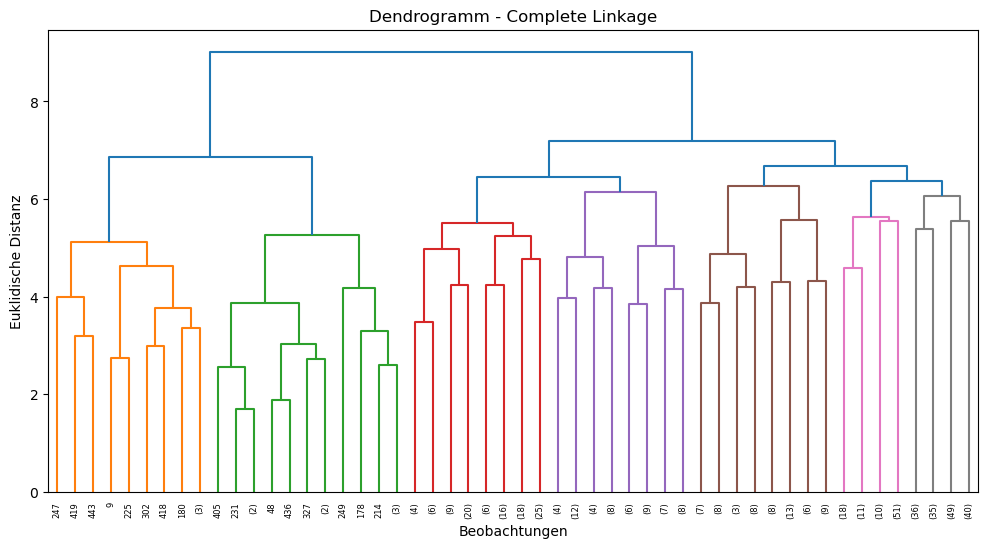

In [70]:
Z_complete = linkage(
    sample_df,
    method="complete",
    metric="euclidean"
)

plt.figure(figsize=(12, 6))

dendrogram(
    Z_complete,
    truncate_mode="level",
    p=5
)

plt.title("Dendrogramm - Complete Linkage")
plt.xlabel("Beobachtungen")
plt.ylabel("Euklidische Distanz")
plt.show()

4. Average Linkage Dendrogramm

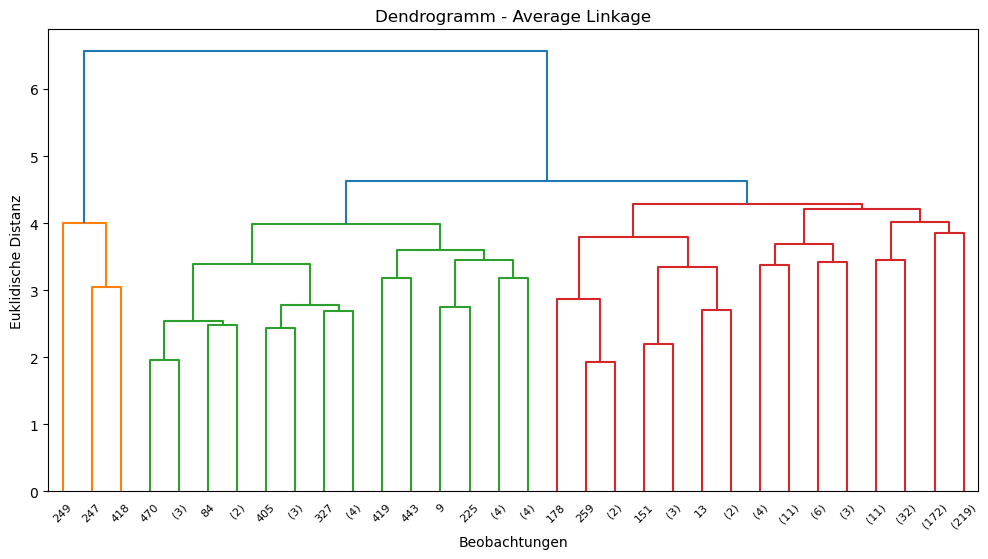

In [71]:
Z_average = linkage(
    sample_df,
    method="average",
    metric="euclidean"
)

plt.figure(figsize=(12, 6))

dendrogram(
    Z_average,
    truncate_mode="level",
    p=5
)

plt.title("Dendrogramm - Average Linkage")
plt.xlabel("Beobachtungen")
plt.ylabel("Euklidische Distanz")
plt.show()

5. Single Linkage Dendrogramm

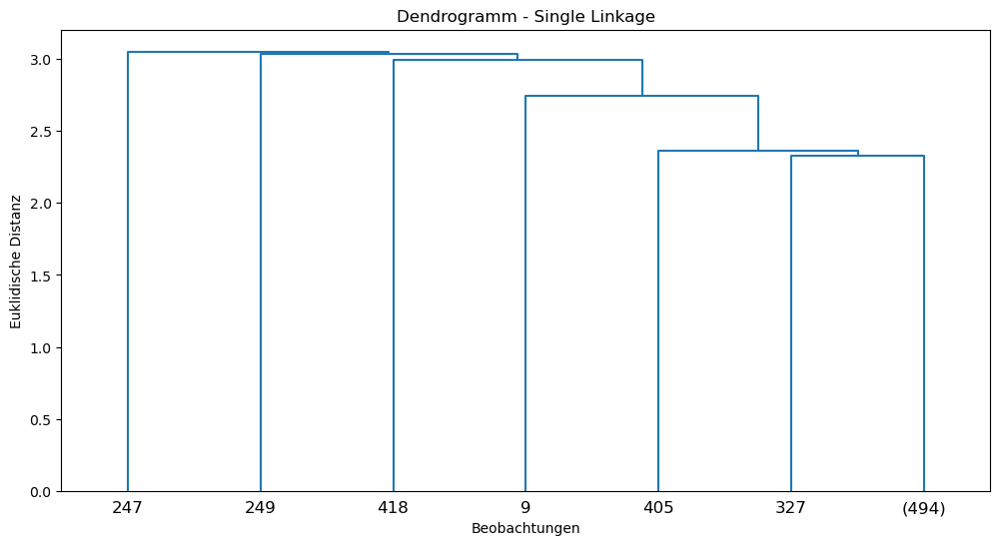

In [72]:
Z_single = linkage(
    sample_df,
    method="single",
    metric="euclidean"
)

plt.figure(figsize=(12, 6))

dendrogram(
    Z_single,
    truncate_mode="level",
    p=5
)

plt.title("Dendrogramm - Single Linkage")
plt.xlabel("Beobachtungen")
plt.ylabel("Euklidische Distanz")
plt.show()

In [73]:
for k in [2,3,4,5]:
    model = AgglomerativeClustering(
        n_clusters=k,
        linkage='complete'
    )

    labels = model.fit_predict(sample_df)

    print(k, silhouette_score(sample_df, labels))

2 0.24534411932620911
3 0.05269119705697621
4 0.04613917666948889
5 0.04670951487895477


6. Clusteranzahl festlegen

In [74]:
n_clusters = 2

7. Sample für Agglomerative Clusterig erstellen

In [75]:
sample_df = cluster_features_scaled_df.sample(
    n=500,
    random_state=42
)
sample_index = sample_df.index

In [76]:
cluster_features

,Transaction_Amount,Account_Balance,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Age,Transaction_Distance,Hour
0,95.97,"93,915.02",14,36.25,0,27,"4,610.43",6
1,55.41,"91,495.28",7,435.42,1,93,"2,284.15",10
2,283.26,"48,484.20",1,363.07,0,78,"4,273.45",5
3,57.24,"89,219.38",14,89.36,0,116,"3,446.99",10
4,58.43,"40,090.04",3,21.28,0,200,"2,968.75",22
...,...,...,...,...,...,...,...,...
49993,11.78,"1,156.01",6,122.14,2,142,"1,776.34",20
49994,17.52,"39,219.34",14,450.87,1,177,"4,209.55",6
49995,462.31,"3,054.33",5,65.13,2,154,"2,631.23",14
49996,213.79,"58,886.60",14,261.21,1,115,"4,079.74",12


8. Agglomerative Clustering durchführen

In [77]:
hc_complete = AgglomerativeClustering(
    n_clusters=n_clusters,
    metric="euclidean",
    linkage="complete"
)

sample_labels = hc_complete.fit_predict(sample_df)

9. Fraud Rate der Clusters aus dem hierarchischem Clustering

In [78]:
hierarchical_sample = pd.DataFrame({
    "HC_Complete": sample_labels
}, index=sample_index)

hierarchical_sample["Fraud_Label"] = df.loc[
    sample_index,
    "Fraud_Label"
]

hierarchical_sample.groupby(
    "HC_Complete"
)["Fraud_Label"].mean() * 100

HC_Average
0   31.01
1   42.31
Name: Fraud_Label, dtype: float64

10. Vergleich zwischen K-Means und hierarchischem Clustering auf der Stichprobe

In [79]:
pd.crosstab(
    df.loc[sample_index, "Cluster"],
    sample_labels,
    rownames=["K-Means"],
    colnames=["Hierarchisch"]
)

Hierarchisch,0,1
K-Means,,
0,157,0
1,141,0
2,46,26
3,130,0


#### Interpretation der Dendrogramme

Für das hierarchische Clustering wurde der euklidische Abstand als Distanzmaß verwendet. Es wurden die drei Linkage-Methoden **Single Linkage**, **Complete Linkage** und **Average Linkage** untersucht und anhand der resultierenden Dendrogramme verglichen.

##### Single Linkage

Das Dendrogramm des Single-Linkage-Verfahrens zeigt einen deutlichen **Chaining-Effekt**. Beobachtungen werden bereits bei relativ kleinen Distanzen schrittweise miteinander verbunden, wodurch lange Clusterketten entstehen. Die Cluster sind dadurch nur schwer voneinander abgrenzbar. Eine sinnvolle Clusteranzahl lässt sich aus diesem Dendrogramm nur eingeschränkt ableiten. Für den vorliegenden Fraud-Datensatz erscheint dieses Verfahren daher weniger geeignet.

##### Complete Linkage

Beim Complete-Linkage-Verfahren entstehen deutlich kompaktere und besser voneinander getrennte Cluster. Die Beobachtungen werden erst bei größeren Distanzen zusammengeführt, wodurch die Clusterstruktur klarer sichtbar wird. Im Dendrogramm sind mehrere mögliche Trennungen erkennbar. Besonders auffällig ist der Distanzsprung vor der letzten großen Fusion der Cluster, was auf eine grundlegende Zweiteilung der Daten hindeutet.

Die zusätzlich durchgeführte Silhouette-Analyse bestätigt diesen Eindruck. Für eine Clusteranzahl von zwei wurde mit einem Silhouette-Wert von 0,245 die beste Clustertrennung erzielt. Bei drei bis fünf Clustern fielen die Werte deutlich geringer aus. Das Complete-Linkage-Verfahren liefert somit die stabilste und am besten getrennte Clusterlösung.

##### Average Linkage

Das Average-Linkage-Dendrogramm zeigt ebenfalls eine nachvollziehbare Clusterstruktur und weist auf mehrere mögliche Clusterlösungen hin. Die Cluster bleiben über einen größeren Distanzbereich stabil und werden erst bei höheren Distanzen zusammengeführt. Die visuelle Interpretation deutete zunächst auf eine Drei-Cluster-Lösung hin.

Die anschließende Validierung mittels Silhouette-Koeffizient zeigte jedoch, dass die Clustertrennung bei drei Clustern deutlich schwächer ausfällt als bei der Zwei-Cluster-Lösung des Complete-Linkage-Verfahrens. Average Linkage liefert somit eine plausible, jedoch weniger gut getrennte Clusterstruktur.

##### Bestimmung der Clusteranzahl

Zur Bestimmung der optimalen Clusteranzahl wurden sowohl die Dendrogramme als auch die Silhouette-Koeffizienten berücksichtigt. Während die visuelle Analyse einzelner Dendrogramme mehrere mögliche Clusterlösungen nahelegte, zeigte die Silhouette-Analyse eine klare Präferenz für eine Zwei-Cluster-Lösung im Complete-Linkage-Verfahren.

Die berechneten Silhouette-Werte lauten:

| Anzahl Cluster | Silhouette-Koeffizient |
| -------------- | ---------------------: |
| 2              |                  0,245 |
| 3              |                  0,053 |
| 4              |                  0,046 |
| 5              |                  0,047 |

Die Zwei-Cluster-Lösung erreicht damit die mit Abstand beste Clustertrennung. Die Cluster weisen eine deutlich höhere interne Homogenität und eine bessere Abgrenzung voneinander auf als Lösungen mit mehr Clustern.

##### Vergleich mit K-Means

Das hierarchische Clustering ermöglicht durch das Dendrogramm eine visuelle Analyse der Clusterstruktur und liefert Hinweise auf die natürliche Gruppierung der Daten. Im Gegensatz dazu benötigt K-Means die Clusteranzahl bereits vor der Durchführung des Algorithmus.

Während K-Means Cluster um Zentren (Clusterzentroide) bildet und eher kompakte, gleich große Cluster erzeugt, identifiziert das hierarchische Clustering mit Complete Linkage vor allem eine grundlegende Zweiteilung der Datenstruktur. Darüber hinaus hebt das Verfahren kleine Gruppen mit besonderen Merkmalsausprägungen hervor.

Die beiden Verfahren liefern somit unterschiedliche Perspektiven auf den Datensatz. K-Means eignet sich insbesondere zur Segmentierung größerer Risikogruppen, während das hierarchische Clustering zusätzliche Hinweise auf spezielle Transaktionsmuster und potenzielle Ausreißer liefert.

##### Fazit

Von den untersuchten Verfahren liefert **Complete Linkage** die überzeugendste Clusterstruktur. Das Verfahren erzeugt kompakte und klar voneinander getrennte Cluster und erreicht mit einer Zwei-Cluster-Lösung den höchsten Silhouette-Koeffizienten.

Single Linkage zeigt aufgrund des Chaining-Effekts keine zufriedenstellende Clustertrennung. Average Linkage liefert zwar eine nachvollziehbare Struktur, erreicht jedoch keine vergleichbare Trennschärfe wie Complete Linkage.

Für den Fraud-Datensatz wird daher **Complete Linkage mit k = 2 Clustern** als geeignetste hierarchische Clusterlösung gewählt.


In [80]:
# K-Means: Anzahl Transaktionen pro Cluster

kmeans_transactions = (
    df.groupby("Cluster")
      .agg(
          Transactions=("Transaction_ID", "count"),
          Fraud_Rate=("Fraud_Label", "mean"),
          Avg_Transaction_Amount=("Transaction_Amount", "mean"),
          Avg_Failed_Transactions=("Failed_Transaction_Count_7d", "mean"),
          Avg_Transaction_Distance=("Transaction_Distance", "mean"),
          Avg_Risk_Score=("Risk_Score", "mean")
      )
      .reset_index()
)

kmeans_transactions["Fraud_Rate"] = (
    kmeans_transactions["Fraud_Rate"] * 100
).round(2)

kmeans_transactions.round(2)

,Cluster,Transactions,Fraud_Rate,Avg_Transaction_Amount,Avg_Failed_Transactions,Avg_Transaction_Distance,Avg_Risk_Score
0,0,16185,15.40,71.25,0.47,"2,564.96",0.50
1,1,14314,39.33,71.86,2.76,"2,418.48",0.50
2,2,5769,28.50,308.80,1.92,"2,559.32",0.50
3,3,13730,45.88,73.36,3.07,"2,480.28",0.50


In [94]:
# Hierarchisches Clustering: Anzahl Transaktionen pro Cluster

hierarchical_sample = df.loc[sample_index].copy()
hierarchical_sample["HC_Complete"] = sample_labels

hierarchical_transactions = (
    hierarchical_sample.groupby("HC_Complete")
      .agg(
          Transactions=("Transaction_ID", "count"),
          Fraud_Rate=("Fraud_Label", "mean"),
          Avg_Transaction_Amount=("Transaction_Amount", "mean"),
          Avg_Failed_Transactions=("Failed_Transaction_Count_7d", "mean"),
          Avg_Transaction_Distance=("Transaction_Distance", "mean"),
          Avg_Risk_Score=("Risk_Score", "mean")
      )
      .reset_index()
)

hierarchical_transactions["Fraud_Rate"] = (
    hierarchical_transactions["Fraud_Rate"] * 100
).round(2)

hierarchical_transactions.round(2)

,HC_Complete,Transactions,Fraud_Rate,Avg_Transaction_Amount,Avg_Failed_Transactions,Avg_Transaction_Distance,Avg_Risk_Score
0,0,474,31.01,85.60,2.00,"2,415.26",0.50
1,1,26,42.31,417.03,1.85,"2,023.57",0.55


#### Interpretation der K-Means-Cluster

Die K-Means-Analyse mit vier Clustern führt zu einer vergleichsweise ausgewogenen Verteilung der Transaktionen auf die einzelnen Cluster. Die Cluster unterscheiden sich insbesondere hinsichtlich der durchschnittlichen Anzahl fehlgeschlagener Transaktionen sowie teilweise bezüglich des durchschnittlichen Transaktionsbetrags.

Besonders auffällig sind die Cluster 1 und 3, die mit durchschnittlich 2,76 bzw. 3,07 fehlgeschlagenen Transaktionen innerhalb der letzten sieben Tage deutlich höhere Werte aufweisen als die übrigen Cluster. Gleichzeitig besitzen diese Cluster mit 39,33 % bzw. 45,88 % die höchsten Fraud-Raten. Dies deutet darauf hin, dass eine erhöhte Anzahl fehlgeschlagener Transaktionen mit einem höheren Betrugsrisiko zusammenhängen könnte.

Cluster 2 unterscheidet sich vor allem durch den deutlich höheren durchschnittlichen Transaktionsbetrag von 308,80. Trotz dieser Besonderheit liegt die Fraud-Rate mit 28,50 % unter den Werten der Cluster 1 und 3.

Cluster 0 weist mit 15,40 % die niedrigste Fraud-Rate auf und zeigt gleichzeitig die geringste Anzahl fehlgeschlagener Transaktionen. Dieser Cluster kann daher als vergleichsweise risikoarm interpretiert werden.

Insgesamt gelingt es K-Means, die Daten in mehrere größere und gut interpretierbare Gruppen zu segmentieren, die sich sowohl hinsichtlich ihrer Merkmale als auch ihrer Fraud-Raten unterscheiden.

#### Interpretation der hierarchischen Cluster

Das hierarchische Clustering mit Complete Linkage und einer Clusteranzahl von zwei erzeugt eine deutlich andere Clusterstruktur als das zuvor betrachtete K-Means-Verfahren. Die Beobachtungen verteilen sich dabei sehr ungleichmäßig auf die beiden Cluster. Während Cluster 0 mit 474 Transaktionen den Großteil der betrachteten Stichprobe umfasst, enthält Cluster 1 lediglich 26 Beobachtungen.

Trotz seiner geringen Größe weist Cluster 1 mehrere auffällige Merkmale auf. Besonders deutlich zeigt sich dies beim durchschnittlichen Transaktionsbetrag. Mit durchschnittlich 417,03 € liegt dieser Wert deutlich über dem Durchschnitt von Cluster 0 mit 85,60 €. Dies deutet darauf hin, dass das hierarchische Clustering eine kleine Gruppe von Transaktionen mit außergewöhnlich hohen Beträgen vom Hauptcluster separiert.

Auch die Fraud-Raten unterscheiden sich zwischen den Clustern:

| Cluster | Fraud-Rate |
|----------|-----------:|
| 0 | 31,01 % |
| 1 | 42,31 % |

Der kleinere Cluster weist somit die höhere Fraud-Rate auf. Dies könnte darauf hindeuten, dass Transaktionen mit besonders hohen Beträgen häufiger mit betrügerischem Verhalten in Verbindung stehen. Aufgrund der sehr geringen Clustergröße von lediglich 26 Beobachtungen sollte dieses Ergebnis jedoch vorsichtig interpretiert werden, da bereits wenige zusätzliche Fraud- oder Non-Fraud-Fälle die Fraud-Rate deutlich verändern können.

### Vergleich mit K-Means

Die beiden Verfahren liefern deutlich unterschiedliche Clusterstrukturen.

K-Means erzeugt mehrere große und vergleichsweise ausgewogene Cluster. Die Segmentierung basiert auf systematischen Unterschieden in den Merkmalen und führt zu einer klaren Trennung von Gruppen mit unterschiedlichen Fraud-Raten. Insbesondere die Cluster 1 und 3 weisen erhöhte Betrugsanteile auf und können als potenzielle Hochrisikogruppen interpretiert werden.

Das hierarchische Clustering verfolgt dagegen einen anderen Ansatz. Auf Basis des Complete-Linkage-Verfahrens und der Silhouette-Analyse erwies sich eine Zwei-Cluster-Lösung als am geeignetsten. Während ein großer Hauptcluster den überwiegenden Teil der Transaktionen umfasst, wird eine kleine Gruppe von Transaktionen mit außergewöhnlichen Merkmalen in einem separaten Cluster zusammengefasst.

Während K-Means vier Cluster mit einer relativ ausgewogenen Verteilung der Beobachtungen erzeugt, identifiziert das hierarchische Clustering primär eine grundlegende Zweiteilung der Datenstruktur.

Ein direkter quantitativer Vergleich beider Verfahren ist nur eingeschränkt möglich, da das hierarchische Clustering aus Rechen- und Darstellungsgründen auf einer Stichprobe von 500 Beobachtungen durchgeführt wurde, während K-Means auf dem vollständigen Datensatz angewendet wurde. Die Ergebnisse werden daher primär qualitativ interpretiert.

### Vergleich der Clusterstrukturen

Die K-Means-Cluster weisen folgende Größen auf:

| Cluster | Transaktionen |
|----------|-------------:|
| 0 | 16.185 |
| 1 | 14.314 |
| 2 | 5.769 |
| 3 | 13.730 |

Die Cluster sind damit vergleichsweise ausgewogen verteilt.

Beim hierarchischen Clustering ergeben sich dagegen folgende Clustergrößen:

| Cluster | Transaktionen |
|----------|-------------:|
| 0 | 474 |
| 1 | 26 |

Die Verteilung ist deutlich unausgewogener. Der kleinere Cluster umfasst nur einen geringen Teil der betrachteten Beobachtungen und kann daher als spezielle Teilgruppe mit ungewöhnlichen Merkmalen interpretiert werden.

### Analyse der Fraud-Raten

Bei K-Means zeigen sich deutliche Unterschiede zwischen den Clustern:

| Cluster | Fraud-Rate |
|----------|-----------:|
| 0 | 15,40 % |
| 1 | 39,33 % |
| 2 | 28,50 % |
| 3 | 45,88 % |

Insbesondere die Cluster 1 und 3 weisen einen deutlich erhöhten Betrugsanteil auf und können daher als potenzielle Hochrisikogruppen interpretiert werden.

Für das hierarchische Clustering ergeben sich folgende Fraud-Raten:

| Cluster | Fraud-Rate |
|----------|-----------:|
| 0 | 31,01 % |
| 1 | 42,31 % |

Der kleinere Cluster weist die höchste Fraud-Rate auf. Aufgrund der sehr geringen Clustergröße sollte dieses Ergebnis jedoch vorsichtig interpretiert werden, da einzelne Beobachtungen die Fraud-Rate vergleichsweise stark beeinflussen können.

### Weitere Clustermerkmale

Ein besonders auffälliger Unterschied zeigt sich beim durchschnittlichen Transaktionsbetrag.

Während Cluster 2 des K-Means-Verfahrens mit durchschnittlich 308,80 € deutlich höhere Transaktionsbeträge aufweist als die übrigen Cluster, enthält der kleine Cluster des hierarchischen Clustering-Verfahrens Transaktionen mit einem durchschnittlichen Betrag von 417,03 €. Dies deutet darauf hin, dass Complete Linkage besonders extreme Transaktionsmuster stärker separiert als K-Means.

Bei den fehlgeschlagenen Transaktionen ergeben sich dagegen nur geringe Unterschiede zwischen den beiden hierarchischen Clustern. Der große Cluster weist durchschnittlich 2,00 fehlgeschlagene Transaktionen auf, der kleinere Cluster 1,85. Im Gegensatz dazu trennt K-Means die Cluster deutlich stärker nach diesem Merkmal und erzeugt Gruppen mit durchschnittlich 0,47 bis 3,07 fehlgeschlagenen Transaktionen. Die Anzahl fehlgeschlagener Transaktionen scheint daher insbesondere für die K-Means-Segmentierung eine wichtige Rolle zu spielen.

Auch die durchschnittliche Transaktionsdistanz unterscheidet sich nur moderat. Der kleinere hierarchische Cluster weist mit 2.023,57 eine etwas geringere durchschnittliche Distanz auf als der Hauptcluster mit 2.415,26. Im Vergleich zu den K-Means-Clustern bleiben die Unterschiede jedoch insgesamt überschaubar.

Der durchschnittliche Risk Score liegt im Hauptcluster bei 0,50 und im kleineren Cluster bei 0,55. Die Unterschiede fallen damit gering aus und deuten darauf hin, dass dieses Merkmal nur begrenzt zur Clustertrennung beiträgt.

### Fazit

Die Ergebnisse zeigen, dass K-Means und hierarchisches Clustering unterschiedliche Perspektiven auf die Datenstruktur liefern.

K-Means erzeugt mehrere ausgewogene Cluster und trennt die Fraud-Raten deutlich voneinander. Dadurch lassen sich potenzielle Risikogruppen vergleichsweise gut identifizieren. Besonders die Cluster 1 und 3 weisen erhöhte Betrugsanteile auf und stellen interessante Zielgruppen für weiterführende Analysen dar.

Das hierarchische Clustering mit Complete Linkage liefert hingegen eine deutlich gröbere Strukturierung der Daten. Die Silhouette-Analyse zeigte, dass eine Zwei-Cluster-Lösung mit einem Silhouette-Wert von 0,245 die beste Clustertrennung erreicht. Das Verfahren identifiziert insbesondere eine kleine Gruppe von Transaktionen mit höheren Betrugsraten und außergewöhnlich hohen Transaktionsbeträgen.

Insgesamt erscheint K-Means für die Segmentierung des Fraud-Datensatzes besser geeignet, da die Cluster ausgewogener sind und klarere Unterschiede im Betrugsverhalten aufweisen. Das hierarchische Clustering liefert jedoch wertvolle zusätzliche Hinweise auf spezielle Transaktionsgruppen und potenzielle Ausreißerstrukturen.

### Fraud Detection mit logistischer Regression

Ziel dieser Analyse ist es, betrügerische Transaktionen anhand verschiedener Einflussvariablen vorherzusagen. Da die Zielvariable `Fraud_Label` binär ist, wird eine logistische Regression verwendet.

Zusätzlich wird berücksichtigt, dass sowohl numerische als auch kategoriale Variablen im Datensatz enthalten sein können. Kategoriale Variablen werden deshalb mittels One-Hot-Encoding in numerische Variablen umgewandelt.

In [82]:
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)

##### 1. Definition der Zielvariable und Einflussvariablen

Die Zielvariable ist `Fraud_Label`. Sie gibt an, ob eine Transaktion betrügerisch ist oder nicht.

Die Spalten `Transaction_ID` und `User_ID` werden ausgeschlossen, da es sich um Identifikationsvariablen handelt. Diese besitzen keinen direkten fachlichen Informationsgehalt für die Modellierung.

In [83]:
exclude_cols = [
    "Transaction_ID",
    "User_ID",
    "Fraud_Label",
    "Cluster",
    "Risk_Score",
]

X = df.drop(
    columns=[col for col in exclude_cols if col in df.columns],
    errors="ignore"
)

y = df["Fraud_Label"]

##### 2. Einbezug kategorialer Variablen

Da eine logistische Regression nur mit numerischen Daten arbeiten kann, werden kategoriale Variablen mit One-Hot-Encoding umgewandelt. Dabei entstehen aus einer kategorialen Variable mehrere binäre Dummy-Variablen.

Mit `drop_first=True` wird eine Referenzkategorie entfernt, um perfekte Multikollinearität zu vermeiden.

In [84]:
X_encoded = pd.get_dummies(X, drop_first=True)

X_encoded.head()

,Transaction_Amount,Account_Balance,Amount_to_Balance_Ratio,IP_Address_Flag,Previous_Fraudulent_Activity,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Age,Transaction_Distance,Hour,Is_Weekend,Transaction_Type_bank transfer,Transaction_Type_online,Transaction_Type_pos,Device_Type_mobile,Device_Type_tablet,Location_mumbai,Location_new york,Location_sydney,Location_tokyo,Merchant_Category_electronics,Merchant_Category_groceries,Merchant_Category_restaurants,Merchant_Category_travel,Card_Type_discover,Card_Type_mastercard,Card_Type_visa,Authentication_Method_otp,Authentication_Method_password,Authentication_Method_pin
0,95.97,"93,915.02",0.00,0,0,14,36.25,0,27,"4,610.43",6,0,False,False,False,True,False,False,True,False,False,False,False,True,False,False,False,True,False,False,True
1,55.41,"91,495.28",0.00,0,0,7,435.42,1,93,"2,284.15",10,0,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,True
2,283.26,"48,484.20",0.01,0,1,1,363.07,0,78,"4,273.45",5,1,False,False,True,False,True,True,False,False,False,True,False,False,False,False,True,False,False,True,False
3,57.24,"89,219.38",0.00,0,0,14,89.36,0,116,"3,446.99",10,0,False,False,False,True,False,False,False,False,True,False,True,False,False,False,False,True,False,False,False
4,58.43,"40,090.04",0.00,0,0,3,21.28,0,200,"2,968.75",22,0,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False


##### 3. Aufteilung in Trainings- und Testdaten

Die Daten werden in Trainings- und Testdaten aufgeteilt. Das Modell wird auf den Trainingsdaten gelernt und anschließend auf den Testdaten bewertet.

Durch `stratify=y` wird sichergestellt, dass der Anteil von Fraud- und Nicht-Fraud-Fällen in Trainings- und Testdaten ähnlich bleibt.

In [85]:
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

##### 4. Standardisierung der Einflussvariablen

Die numerischen Werte werden standardisiert, damit Variablen mit großen Wertebereichen das Modell nicht dominieren.

Wichtig ist, dass der `StandardScaler` nur auf den Trainingsdaten gelernt wird. Die Testdaten werden anschließend mit denselben Skalierungsparametern transformiert.

In [86]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

##### 5. Modelltraining

Da die Zielvariable binär ist, wird eine logistische Regression verwendet. Dieses Verfahren modelliert die Wahrscheinlichkeit, dass eine Transaktion betrügerisch ist.

In [87]:
model = LogisticRegression(max_iter=1000)

model.fit(X_train_scaled, y_train)

,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary ` for details.",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lbfgs'.To choose a solver, you might want to consider the following aspects:- 'lbfgs' is a good default solver because it works reasonably well for a wide class of problems.- For :term:`mul

##### 6. Prediction

Mit dem trainierten Modell werden nun Vorhersagen auf den Testdaten erstellt.

In [88]:
y_pred = model.predict(X_test_scaled)

y_pred[:10]

array([0, 0, 0, 1, 0, 0, 1, 0, 0, 0])

##### 7. Bewertung der Modellqualität

Zur Bewertung des Modells werden Accuracy, Precision, Recall und F1-Score verwendet.

Besonders wichtig sind bei Fraud Detection Precision und Recall:

- Precision zeigt, wie viele der als Fraud vorhergesagten Fälle tatsächlich Fraud waren.
- Recall zeigt, wie viele tatsächliche Fraud-Fälle vom Modell erkannt wurden.
- Der F1-Score kombiniert Precision und Recall.

In [89]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)

Accuracy: 0.8717
Precision: 0.9595238095238096
Recall: 0.6271397447868036
F1-Score: 0.7585168454733672


In [90]:
print(confusion_matrix(y_test, y_pred))

[[6702   85]
 [1198 2015]]


In [91]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.99      0.91      6787
           1       0.96      0.63      0.76      3213

    accuracy                           0.87     10000
   macro avg       0.90      0.81      0.84     10000
weighted avg       0.88      0.87      0.86     10000



##### 8. Interpretation der Regressionskoeffizienten

Die Koeffizienten der logistischen Regression zeigen, welchen Einfluss eine Variable auf die Fraud-Wahrscheinlichkeit hat.

Ein positiver Koeffizient erhöht die Wahrscheinlichkeit für Fraud.
Ein negativer Koeffizient senkt die Wahrscheinlichkeit für Fraud.

Da die Variablen standardisiert wurden, können die Koeffizienten miteinander verglichen werden.

In [92]:
coef_df = pd.DataFrame({
    "Variable": X_encoded.columns,
    "Koeffizient": model.coef_[0],
    "Odds_Ratio": np.exp(model.coef_[0])
})

coef_df["Absoluter_Einfluss"] = coef_df["Koeffizient"].abs()

coef_df = coef_df.sort_values(
    by="Absoluter_Einfluss",
    ascending=False
)

coef_df.head(20)

,Variable,Koeffizient,Odds_Ratio,Absoluter_Einfluss
7,Failed_Transaction_Count_7d,1.38,3.98,1.38
16,Device_Type_tablet,0.03,1.03,0.03
14,Transaction_Type_pos,-0.02,0.98,0.02
26,Card_Type_mastercard,-0.02,0.98,0.02
27,Card_Type_visa,-0.02,0.98,0.02
5,Daily_Transaction_Count,-0.02,0.98,0.02
13,Transaction_Type_online,-0.02,0.98,0.02
23,Merchant_Category_restaurants,0.01,1.01,0.01
20,Location_tokyo,0.01,1.01,0.01
11,Is_Weekend,0.01,1.01,0.01


##### 9. Wichtigste Einflussfaktoren

Die wichtigsten Einflussfaktoren sind die Variablen mit den größten absoluten Koeffizienten. Diese Variablen haben den stärksten Einfluss auf die Vorhersage der Zielvariable.

Besonders auffällig ist, wenn Variablen wie `Failed_Transaction_Count_7d` weit oben stehen. Eine hohe Anzahl fehlgeschlagener Transaktionen innerhalb kurzer Zeit kann fachlich als starkes Warnsignal für potenziellen Betrug interpretiert werden.

In [93]:
top_features = coef_df.head(10)

top_features

,Variable,Koeffizient,Odds_Ratio,Absoluter_Einfluss
7,Failed_Transaction_Count_7d,1.38,3.98,1.38
16,Device_Type_tablet,0.03,1.03,0.03
14,Transaction_Type_pos,-0.02,0.98,0.02
26,Card_Type_mastercard,-0.02,0.98,0.02
27,Card_Type_visa,-0.02,0.98,0.02
5,Daily_Transaction_Count,-0.02,0.98,0.02
13,Transaction_Type_online,-0.02,0.98,0.02
23,Merchant_Category_restaurants,0.01,1.01,0.01
20,Location_tokyo,0.01,1.01,0.01
11,Is_Weekend,0.01,1.01,0.01


#### Vergleich zur Clusteranalyse

Die vorherige Clusteranalyse mit K-Means zeigte sehr niedrige Silhouette-Werte. Diese lagen ungefähr im Bereich von 0,07 bis 0,10. Das spricht dafür, dass die Daten keine stark ausgeprägte natürliche Clusterstruktur besitzen.

Die Cluster trennten Fraud-Fälle nicht eindeutig. Auch auffällige Merkmale wie `Failed_Transaction_Count_7d = 4` führten nicht automatisch zu einem eigenen Cluster, da K-Means alle Variablen gleichzeitig betrachtet und keine Zielvariable verwendet.

Die logistische Regression ist für diese Fragestellung daher besser geeignet, weil sie gezielt den Zusammenhang zwischen Einflussvariablen und der Zielvariable `Fraud_Label` modelliert.

### Interpretation

#### Warum wurde dieses Regressionsverfahren gewählt?

Es wurde eine logistische Regression gewählt, da die Zielvariable `Fraud_Label` binär ist. Die logistische Regression eignet sich besonders für Klassifikationsprobleme mit zwei möglichen Ausprägungen, zum Beispiel Fraud und Nicht-Fraud.

Ein weiterer Vorteil ist die gute Interpretierbarkeit. Mithilfe der Koeffizienten und Odds Ratios kann nachvollzogen werden, welche Variablen die Fraud-Wahrscheinlichkeit erhöhen oder senken.

#### Welche Variablen haben den stärksten Einfluss auf die Zielvariable?

Zur Identifikation der wichtigsten Einflussfaktoren wurden die Regressionskoeffizienten der logistischen Regression analysiert. Da die Variablen vor dem Modelltraining standardisiert wurden, können die Koeffizienten direkt miteinander verglichen werden.

Die Variable **Failed_Transaction_Count_7d** weist mit einem Koeffizienten von **1,38** den mit Abstand stärksten Einfluss auf die Zielvariable auf. Dies bedeutet, dass eine Zunahme fehlgeschlagener Transaktionen innerhalb der letzten sieben Tage die Wahrscheinlichkeit eines Betrugsfalls deutlich erhöht.

Der zweitstärkste Einflussfaktor hätte **Risk_Score**. Dieser weist ebenfalls einen positiven Zusammenhang mit der Betrugswahrscheinlichkeit auf. Allerdings ist die Berechnung des Risk_Score innerhalb des Datensatzes nicht transparent dokumentiert. Es ist anzunehmen, dass dieser bereits auf Basis weiterer Risikomerkmale berechnet wurde und somit mehrere Informationen aggregiert. Dadurch ist die direkte Interpretation dieses Merkmals nur eingeschränkt möglich und die Variable wurde letztendlich für die logistische Regression verworfen.

Die Betrugswahrscheinlichkeit wird im Datensatz fast vollständig durch ein Merkmale erklärt. Alle übrigen numerischen und kategorialen Variablen liefern nur einen geringen zusätzlichen Informationsgewinn.

#### Sind die Ergebnisse fachlich plausibel?

Die Ergebnisse der logistischen Regression erscheinen teilweise fachlich plausibel. Insbesondere der starke Einfluss der Variable **Failed_Transaction_Count_7d** entspricht bekannten Erkenntnissen aus dem Bereich Fraud Detection. Wiederholte fehlgeschlagene Transaktionsversuche können auf missbräuchliche Aktivitäten, fehlerhafte Authentifizierungsversuche oder automatisierte Angriffe hindeuten und gelten daher als typisches Warnsignal für potenzielle Betrugsfälle.

Auch der Einfluss des **Risk_Score** ist grundsätzlich nachvollziehbar, da dieser Wert bereits eine aggregierte Risikoeinschätzung darstellt. Höhere Risikobewertungen sollten erwartungsgemäß mit einer höheren Wahrscheinlichkeit für Betrugsfälle einhergehen.

Darüber hinaus ist plausibel, dass die übrigen Variablen nur einen vergleichsweise geringen Einfluss aufweisen. Dies deutet darauf hin, dass Betrugsfälle in diesem Datensatz nicht durch viele gleich starke Einflussfaktoren erklärt werden, sondern vor allem durch wenige zentrale Risikomerkmale. Dennoch können in realen Beispielen auch noch andere Merkmale stark auf Betrug hindeuten.

Insgesamt stimmen die Ergebnisse mit den Erwartungen an typische Fraud-Muster überein und können daher als fachlich nachvollziehbar bewertet werden.

#### Handlungsempfehlungen

Aus den Ergebnissen der Analyse lassen sich mehrere konkrete Handlungsempfehlungen ableiten.

Da die Variable **Failed_Transaction_Count_7d** den stärksten Einfluss auf die Betrugswahrscheinlichkeit besitzt, sollte dieses Merkmal zukünftig stärker in operative Sicherheitsmaßnahmen integriert werden.

Eine mögliche Maßnahme besteht darin, Benutzerkonten oder Transaktionenanhand der vorliegenden Daten automatisch zu sperren, sobald innerhalb eines Zeitraums von sieben Tagen vier fehlgeschlagene Transaktionsversuche registriert wurden. Die Analyse hat gezeigt, dass bei diesem Schwellenwert mit 100% ein besonders hohes Fraud-Risiko vorliegt.

Zusätzlich könnte bereits ab drei fehlgeschlagenen Transaktionen eine automatische Warnung ausgelöst werden. Dadurch könnten potenziell kritische Fälle frühzeitig identifiziert und einer weiteren Prüfung unterzogen werden, bevor tatsächlich ein Betrugsfall eintritt.

Darüber hinaus sollte das entwickelte Modell kontinuierlich überwacht und weiterentwickelt werden. Betrugsmuster verändern sich im Zeitverlauf, da Betrüger ihre Vorgehensweisen an bestehende Sicherheitsmechanismen anpassen. Deshalb sollten regelmäßig neue Daten in das Modell integriert und die Modellgüte erneut überprüft werden.

Ferner könnte untersucht werden, ob leistungsfähigere Verfahren wie Random Forests, Gradient Boosting oder XGBoost eine höhere Erkennungsrate erzielen als die verwendete logistische Regression. Diese Verfahren sind in der Lage, komplexe nichtlineare Zusammenhänge zwischen den Einflussvariablen abzubilden und werden häufig erfolgreich im Bereich der Fraud Detection eingesetzt.

Zusammenfassend zeigt die Analyse, dass insbesondere die Anzahl fehlgeschlagener Transaktionen ein zentraler Risikofaktor für Betrugsfälle ist. Durch die Einführung automatisierter Warn- und Sperrmechanismen sowie die kontinuierliche Weiterentwicklung der Modelle kann die Betrugserkennung künftig weiter verbessert werden.